In [1]:
#!usr/bin/env python3
# -*- coding:utf-8 -*-

In [3]:
import numpy as np
import librosa
import librosa.display
import IPython.display
import matplotlib.pyplot as plt
import pandas as pd
%matplotlib inline
# import util

In [4]:
# 波形情報とサンプリングレート(デフォルトでは22500Hz)を取得
mix_path = './src/experiment/UNION!!-original.wav'
inst_path = './src/experiment/UNION!!-inst.wav'
vocal_path = './src/experiment/UNION!!-vocal.wav'

y_mix, sr_mix = librosa.load(mix_path, sr=44100)
y_inst, sr_inst = librosa.load(inst_path, sr=44100)
y_vocal, sr_vocal = librosa.load(vocal_path, sr=44100)

In [5]:
IPython.display.Audio(data=y_mix, rate=sr_mix)

In [6]:
IPython.display.Audio(data=y_inst, rate=sr_inst)

In [7]:
IPython.display.Audio(data=y_vocal, rate=sr_vocal)

## メル(尺度)周波数
メル尺度(mel scale)は音高の知覚的尺度である．  
メル尺度の差が同じであれば，人間が感じる音高の差が同じになることを意図している．  
人間は可聴域の下限に近い音は高め，上限に近い音は低めに聞こえるらしい．

メル尺度は1000 \[mel\] = 1000 \[Hz\] を基準とし，以下の式で計算される．
$$ m = m_0 \ln{ \left ( \frac{f}{f_0} + 1 \right )} $$
$f_0$は自由パラメータで基準周波数を表し，$m_0$は$1000[mel] = 1000[Hz]$という制約から導かれる式  
$$ m_0 = \frac{1000}{\ln{ \left ( \frac{1000}{f_0} + 1 \right )}} $$
で算出される従属パラメータである．

よく使われる式は
$$ m = 1127.010480 \ln{ \left (\frac{f}{700[Hz]} + 1 \right )} $$

1000\[mel\]から高さが2倍に「感じる」音が2000\[mel\]，半分に感じる音が500\[mel\]であり，周波数領域でのオクターブ(:周波数が二倍)とは異なるので注意が必要．

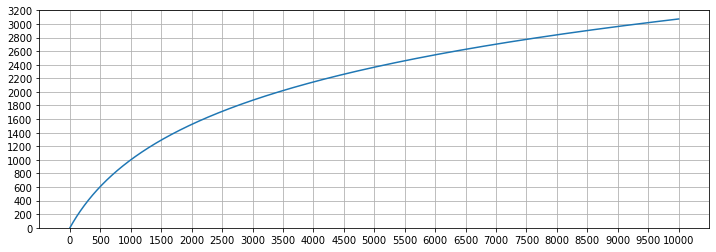

In [20]:
# メル周波数の図示
x = np.linspace(0, 10000, 10000)
m = 1127 * (np.log(x / 700 + 1))

plt.figure(facecolor='w', figsize=(12, 4))
plt.plot(x, m)
plt.xticks(np.arange(0, 10000 + 1, 500))
plt.yticks(np.arange(0, 3200 + 1, 200))
plt.ylim(0, 3200)
plt.grid(True)
plt.show()

In [15]:
# # メルスケールのパワー(音圧)スペクトログラムを作成
# S_mix = librosa.feature.melspectrogram(y_mix, sr=sr_mix, n_mels=128)
# S_inst = librosa.feature.melspectrogram(y_inst, sr=sr_inst, n_mels=128)
# S_vocal = librosa.feature.melspectrogram(y_vocal, sr=sr_vocal, n_mels=128)

# # 旧librosa.core.logamplitude
# # ログスケール(dB:デシベル)に変換，ピーク音圧を参照する
# log_S_mix = librosa.power_to_db(S_mix, ref=np.max)
# log_S_inst = librosa.power_to_db(S_inst, ref=np.max)
# log_S_vocal = librosa.power_to_db(S_vocal, ref=np.max)

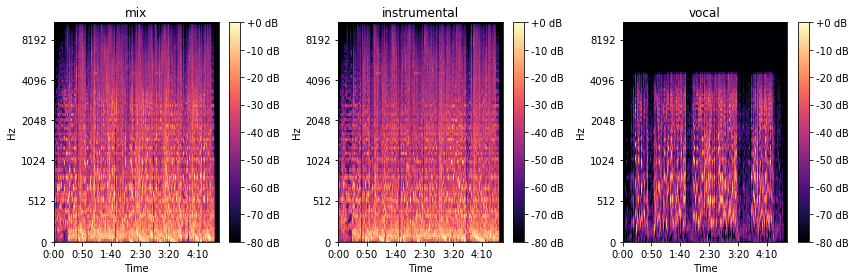

In [16]:
# # スペクトログラムの描画
# plt.figure(figsize=(12, 4))
# plt.subplot(131)
# librosa.display.specshow(log_S_mix, sr=sr_mix, x_axis='time', y_axis='mel')
# plt.title('mix')
# plt.colorbar(format='%+02.0f dB')

# plt.subplot(132)
# librosa.display.specshow(log_S_inst, sr=sr_inst, x_axis='time', y_axis='mel')
# plt.title('instrumental')
# plt.colorbar(format='%+02.0f dB')

# plt.subplot(133)
# librosa.display.specshow(log_S_vocal, sr=sr_vocal, x_axis='time', y_axis='mel')
# plt.title('vocal')
# plt.colorbar(format='%+02.0f dB')

# plt.tight_layout()
# plt.show()

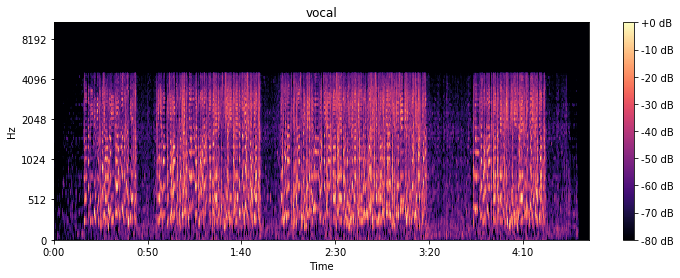

In [17]:
# plt.figure(figsize=(12, 4))
# librosa.display.specshow(log_S_vocal, sr=sr_vocal, x_axis='time', y_axis='mel')
# plt.title('vocal')
# plt.colorbar(format='%+02.0f dB')
# plt.show()

以下，テスト音源での分析

In [1]:
# from librosa.core import load, resample, stft, istft
# from librosa.output import write_wav
# from librosa.util import find_files
# import numpy as np
# import const as C
# import os

In [27]:
# PATH_IMAS = './src/test'
# file_list = find_files(PATH_IMAS, ext='wav')
# file_list

['C:\\Users\\げんげん\\Desktop\\deep_U-Net_vocal_separation\\src\\test\\AClassicEducation_NightOwl.wav',
 'C:\\Users\\げんげん\\Desktop\\deep_U-Net_vocal_separation\\src\\test\\AClassicEducation_NightOwl_inst.wav']

In [28]:
# # mixture, instrumentalの2セットずつあるのでstep=2
# for i in range(0, len(file_list), 2):
#     print('Processing: ' + file_list[i])
#     print('Processing: ' + file_list[i+1])
    
#     # 各音源の読み込み(time series:時系列データ)
#     y_mix, _ = load(file_list[i], sr=None)
#     y_inst, sr = load(file_list[i+1], sr=None)
    
#     # 非ゼロ要素のインデックスを取得(np.nonzero()はタプルを返す)して抽出
#     y_mix = y_mix[np.nonzero(y_mix)[0][0]:]
#     y_inst = y_inst[np.nonzero(y_inst)[0][0]:]
    
#     # 曲の長さが異なっていると演算ができないので，短い方を取得
#     min_length = min([y_mix.size, y_inst.size])
    
#     # 長さを揃えつつ，リサンプリング(sr=44100kHzからC.SAMPLINGRATE=16000kHzに変換)
#     y_mix = resample(y_mix[:min_length], 44100, C.SAMPLING_RATE)
#     y_inst = resample(y_inst[:min_length], 44100, C.SAMPLING_RATE)
    
#     # スペクトログラムを保存(npz形式)
#     file_name = file_list[i].split('\\')[-1].split('.')[0]
#     util.save_vocal(y_mix, y_inst, file_name)

Processing: C:\Users\げんげん\Desktop\deep_U-Net_vocal_separation\src\test\AClassicEducation_NightOwl.wav
Processing: C:\Users\げんげん\Desktop\deep_U-Net_vocal_separation\src\test\AClassicEducation_NightOwl_inst.wav
Saving: ./src/audio_check/AClassicEducation_NightOwl.wav


In [29]:
# # 波形情報とサンプリングレート(デフォルトでは22500Hz)を取得
# mix_path = './src/test/AClassicEducation_NightOwl.wav'
# inst_path = './src/test/AClassicEducation_NightOwl_inst.wav'
# vocal_path = './src/audio_check/AClassicEducation_NightOwl_vocal.wav'
# vocal_ans_path = './src/AClassicEducation_NightOwl_vocal_ans.wav'

# y_mix, sr_mix = librosa.load(mix_path, sr=44100)
# y_inst, sr_inst = librosa.load(inst_path, sr=44100)
# y_vocal, sr_vocal = librosa.load(vocal_path, sr=44100)
# y_vocal_ans, sr_vocal_ans = librosa.load(vocal_ans_path, sr=44100)

In [30]:
# # メルスケールのパワー(音圧)スペクトログラムを作成
# S_mix = librosa.feature.melspectrogram(y_mix, sr=sr_mix, n_mels=128)
# S_inst = librosa.feature.melspectrogram(y_inst, sr=sr_inst, n_mels=128)
# S_vocal = librosa.feature.melspectrogram(y_vocal, sr=sr_vocal, n_mels=128)
# S_vocal_ans = librosa.feature.melspectrogram(y_vocal_ans, sr=sr_vocal_ans, n_mels=128)

# # 旧librosa.core.logamplitude
# # ログスケール(dB:デシベル)に変換，ピーク音圧を参照する
# log_S_mix = librosa.power_to_db(S_mix, ref=np.max)
# log_S_inst = librosa.power_to_db(S_inst, ref=np.max)
# log_S_vocal = librosa.power_to_db(S_vocal, ref=np.max)
# log_S_vocal_ans = librosa.power_to_db(S_vocal_ans, ref=np.max)

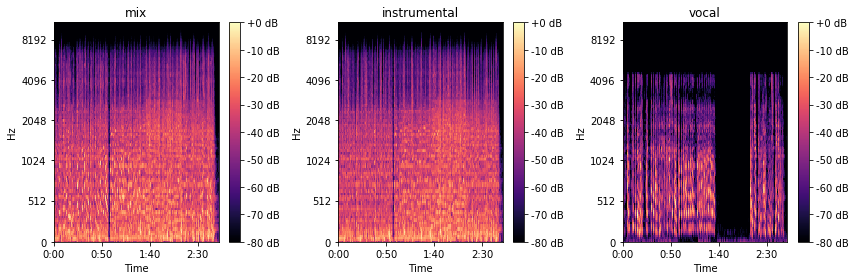

In [31]:
# # スペクトログラムの描画
# plt.figure(figsize=(12, 4))
# plt.subplot(131)
# librosa.display.specshow(log_S_mix, sr=sr_mix, x_axis='time', y_axis='mel')
# plt.title('mix')
# plt.colorbar(format='%+02.0f dB')

# plt.subplot(132)
# librosa.display.specshow(log_S_inst, sr=sr_inst, x_axis='time', y_axis='mel')
# plt.title('instrumental')
# plt.colorbar(format='%+02.0f dB')

# plt.subplot(133)
# librosa.display.specshow(log_S_vocal, sr=sr_vocal, x_axis='time', y_axis='mel')
# plt.title('vocal')
# plt.colorbar(format='%+02.0f dB')

# plt.tight_layout()
# plt.show()

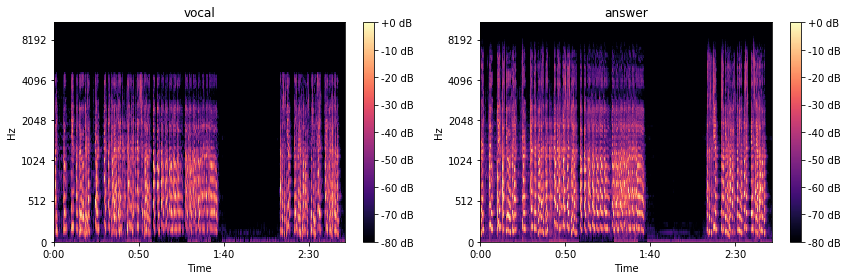

In [17]:
# plt.figure(figsize=(12, 4))
# plt.subplot(121)
# librosa.display.specshow(log_S_vocal, sr=sr_mix, x_axis='time', y_axis='mel')
# plt.title('vocal')
# plt.colorbar(format='%+02.0f dB')

# plt.subplot(122)
# librosa.display.specshow(log_S_vocal_ans, sr=sr_inst, x_axis='time', y_axis='mel')
# plt.title('answer')
# plt.colorbar(format='%+02.0f dB')

# plt.tight_layout()
# plt.show()

In [ ]:
#  # 各音源の読み込み(time series:時系列データ)
# y_mix, _ = load(, sr=None)
# y_inst, sr = load(file_list[i+1], sr=None)

# # 非ゼロ要素のインデックスを取得(np.nonzero()はタプルを返す)して抽出
# y_mix = y_mix[np.nonzero(y_mix)[0][0]:]
# y_inst = y_inst[np.nonzero(y_inst)[0][0]:]

# # 曲の長さが異なっていると演算ができないので，短い方を取得
# min_length = min([y_mix.size, y_inst.size])

# # 長さを揃えつつ，リサンプリング(sr=44100kHzからC.SAMPLINGRATE=16000kHzに変換)
# y_mix = resample(y_mix[:min_length], 44100, C.SAMPLING_RATE)
# y_inst = resample(y_inst[:min_length], 44100, C.SAMPLING_RATE)

# # スペクトログラムを保存(npz形式)
# file_name = file_list[i].split('\\')[-1].split('.')[0]
# util.save_vocal(y_mix, y_inst, file_name)


# y_mixture = 

# mix_spec, inst_spec, vocal_spec = make_spectrograms(y_mixture, y_instrumental)

# phase = np.exp(1.j*np.angle(vocal_spec))  # 位相情報

# # 逆短時間フーリエ変換により，位相情報を含むスペクトログラムから音声信号を復元
# y_vocal = istft(vocal_spec*phase,
#                 hop_length=C.HOP_LENGTH, win_length=C.FFT_SIZE)

# # ファイル名を'曲名_vocal.wav'にして保存
# write_wav('E:\\Datasets\\sound\\DSD100\\audio_check\\' + file_name + '_vocal' + '.wav', y_vocal, C.SAMPLING_RATE, norm=True)
# print('Saving: E:\Datasets\sound\DSD100' + file_name + '.wav')